# Import libraries

In [43]:
import pandas as pd
from scipy.stats import wilcoxon
import matplotlib.pyplot as plt
from matplotlib import rc
import numpy as np
import utils
import config
import re
import os

In [44]:
# set figure details
# rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
# rc('text', usetex=True)
rc("svg", fonttype="none") 

# Metadata

In [45]:
metadata = pd.read_csv(os.path.join(config.CLEAN_DIR, "metadata.tsv"), sep="\t", index_col=0)
metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,expo_cat1,expo_cat2,calc_age_mo,currentfeed_bf,currentfeed_f,currentfeed_o,Sequencing_Project,Filename,Extraction,depth
Sample_ID,,,,,,,,,,,,,,,,,,,,,
magic.0001,101,no,12/10/16,1430,0,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.07,1.0,0.0,magic.0001,Knights_Project_046,magic.0001.S22.001.fa,MagAttract,1544781
magic.0004,101,no,12/15/16,NaN,1,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.23,1.0,0.0,magic.0004,Knights_Project_046,magic.0004.S34.001.fa,MagAttract,1167038
magic.0006,104,yes,12/15/16,2335,0,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.03,1.0,1.0,magic.0006,Knights_Project_076_Pool3,magic.0006.S145.001.fa,PowerSoil,1720636
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.03,1.0,1.0,magic.0007,Knights_Project_076_Pool3,magic.0007.S155.001.fa,PowerSoil,6825017
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.03,1.0,1.0,magic.0008,Knights_Project_055,X8.S125.001.fa,PowerSoil,2928044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,24.11,NaN,NaN,magic.6595,Knights_Project_077_Pool3,magic.6595.S253.001.fa,PowerSoilPro,1562968
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,No antibiotics,Vaginal,24.11,NaN,NaN,magic.6597,Knights_Project_077_Pool3,magic.6597.S265.001.fa,PowerSoilPro,2113880
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,GBS antibiotics,C-section with labor,24.34,NaN,NaN,magic.6598,Knights_Project_077_Pool3,magic.6598.S277.001.fa,PowerSoilPro,1650388


In [46]:
genefamilies = pd.read_csv(os.path.join(config.CLEAN_DIR, "humann_genefamilies_clean.tsv"), sep="\t", index_col=0)

gene_richness = (genefamilies > 0).sum(axis=1)
metadata["Gene Richness"] = gene_richness

CAGs = pd.read_csv(os.path.join(config.CLEAN_DIR, "reduced_CAG_profiles_clean.tsv"), sep="\t", index_col=0)
CAG_richness = (CAGs > 0).sum(axis=1)
metadata["CAG Richness"] = CAG_richness

pathways = pd.read_csv(os.path.join(config.CLEAN_DIR, "humann_pathcoverage_clean.tsv"), sep="\t", index_col=0)

pathway_richness = (pathways > 0.75).sum(axis=1)
metadata["Pathway Richness"] = pathway_richness

df = pd.read_csv("../data/raw/species_rarefied.txt", sep="\t")
df = df.T
relative_abundances = df.div(df.sum(axis=1), axis=0)

species_richness = (relative_abundances > 0.00001).sum(axis=1)
shannon_diversity = -(relative_abundances * np.log(relative_abundances)).fillna(0).sum(axis=1)

metadata = metadata.loc[relative_abundances.index]

metadata["Species Richness"] = species_richness
metadata["Shannon Diversity"] = shannon_diversity

metadata

/Users/daniel/opt/anaconda3/envs/magic/lib/python3.10/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,currentfeed_o,Sequencing_Project,Filename,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness,Shannon Diversity
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,magic.0007,Knights_Project_076_Pool3,magic.0007.S155.001.fa,PowerSoil,6825017,8650,146,36,243,2.248965
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,magic.0008,Knights_Project_055,X8.S125.001.fa,PowerSoil,2928044,7908,129,39,160,1.548390
magic.0010,101,no,12/10/16,2230,0,regular,NaN,NaN,NaN,NaN,...,magic.0010,Knights_Project_076_Pool3,magic.0010.S167.001.fa,PowerSoil,7251673,7873,126,40,150,0.932723
magic.0012,105,no,12/22/16,950,1,regular,NaN,NaN,NaN,soft,...,magic.0012,Knights_Project_076_Pool3,magic.0012.S177.001.fa,PowerSoil,8106772,8738,152,40,304,1.928827
magic.0014,106,no,12/22/16,250,1,regular,NaN,NaN,NaN,watery,...,magic.0014,Knights_Project_068_Pool1,magic.0014.S1.001.fa,PowerSoil,15346610,9296,150,31,209,1.177484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,magic.6595,Knights_Project_077_Pool3,magic.6595.S253.001.fa,PowerSoilPro,1562968,3745,119,64,873,3.794591
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,magic.6597,Knights_Project_077_Pool3,magic.6597.S265.001.fa,PowerSoilPro,2113880,1928,73,52,757,4.276521
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,magic.6598,Knights_Project_077_Pool3,magic.6598.S277.001.fa,PowerSoilPro,1650388,4586,112,67,789,3.873291
magic.6599,573,NaN,7/21/21,845,96,regular,NaN,NaN,NaN,soft,...,magic.6599,Knights_Project_077_Pool3,magic.6599.S288.001.fa,PowerSoilPro,1519641,3658,92,52,1059,4.765721


In [47]:
gene_richness = pd.read_csv("../data/clean/rarified_gene_richness.tsv", sep="\t", index_col=0)
metadata["Gene Richness"] = gene_richness.loc[metadata.index]
metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,currentfeed_o,Sequencing_Project,Filename,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness,Shannon Diversity
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,magic.0007,Knights_Project_076_Pool3,magic.0007.S155.001.fa,PowerSoil,6825017,89717.0,146,36,243,2.248965
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,magic.0008,Knights_Project_055,X8.S125.001.fa,PowerSoil,2928044,61474.0,129,39,160,1.548390
magic.0010,101,no,12/10/16,2230,0,regular,NaN,NaN,NaN,NaN,...,magic.0010,Knights_Project_076_Pool3,magic.0010.S167.001.fa,PowerSoil,7251673,62169.0,126,40,150,0.932723
magic.0012,105,no,12/22/16,950,1,regular,NaN,NaN,NaN,soft,...,magic.0012,Knights_Project_076_Pool3,magic.0012.S177.001.fa,PowerSoil,8106772,95076.0,152,40,304,1.928827
magic.0014,106,no,12/22/16,250,1,regular,NaN,NaN,NaN,watery,...,magic.0014,Knights_Project_068_Pool1,magic.0014.S1.001.fa,PowerSoil,15346610,74356.0,150,31,209,1.177484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,magic.6595,Knights_Project_077_Pool3,magic.6595.S253.001.fa,PowerSoilPro,1562968,185364.0,119,64,873,3.794591
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,magic.6597,Knights_Project_077_Pool3,magic.6597.S265.001.fa,PowerSoilPro,2113880,176493.0,73,52,757,4.276521
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,magic.6598,Knights_Project_077_Pool3,magic.6598.S277.001.fa,PowerSoilPro,1650388,142285.0,112,67,789,3.873291
magic.6599,573,NaN,7/21/21,845,96,regular,NaN,NaN,NaN,soft,...,magic.6599,Knights_Project_077_Pool3,magic.6599.S288.001.fa,PowerSoilPro,1519641,155385.0,92,52,1059,4.765721


In [48]:
metadata["abx"] = metadata["expo_cat1"]
metadata["abx"] = metadata["abx"].apply(lambda x : "No antibiotics" if x == "No antibiotics" else "Antibiotics")
abxs = metadata["abx"].unique()
display(abxs)
metadata

array(['No antibiotics', 'Antibiotics'], dtype=object)

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,Sequencing_Project,Filename,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness,Shannon Diversity,abx
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,Knights_Project_076_Pool3,magic.0007.S155.001.fa,PowerSoil,6825017,89717.0,146,36,243,2.248965,No antibiotics
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,Knights_Project_055,X8.S125.001.fa,PowerSoil,2928044,61474.0,129,39,160,1.548390,No antibiotics
magic.0010,101,no,12/10/16,2230,0,regular,NaN,NaN,NaN,NaN,...,Knights_Project_076_Pool3,magic.0010.S167.001.fa,PowerSoil,7251673,62169.0,126,40,150,0.932723,No antibiotics
magic.0012,105,no,12/22/16,950,1,regular,NaN,NaN,NaN,soft,...,Knights_Project_076_Pool3,magic.0012.S177.001.fa,PowerSoil,8106772,95076.0,152,40,304,1.928827,No antibiotics
magic.0014,106,no,12/22/16,250,1,regular,NaN,NaN,NaN,watery,...,Knights_Project_068_Pool1,magic.0014.S1.001.fa,PowerSoil,15346610,74356.0,150,31,209,1.177484,No antibiotics
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,Knights_Project_077_Pool3,magic.6595.S253.001.fa,PowerSoilPro,1562968,185364.0,119,64,873,3.794591,No antibiotics
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,Knights_Project_077_Pool3,magic.6597.S265.001.fa,PowerSoilPro,2113880,176493.0,73,52,757,4.276521,No antibiotics
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,Knights_Project_077_Pool3,magic.6598.S277.001.fa,PowerSoilPro,1650388,142285.0,112,67,789,3.873291,Antibiotics
magic.6599,573,NaN,7/21/21,845,96,regular,NaN,NaN,NaN,soft,...,Knights_Project_077_Pool3,magic.6599.S288.001.fa,PowerSoilPro,1519641,155385.0,92,52,1059,4.765721,Antibiotics


In [61]:
ptr = pd.read_csv(os.path.join(config.CLEAN_DIR, "ptr.csv"), index_col=0)
ptr = ptr[metadata.index]
ptr

,magic.0007,magic.0008,magic.0010,magic.0012,magic.0014,magic.0017,magic.0019,magic.0022,magic.0023,magic.0024,...,magic.6590,magic.6591,magic.6592,magic.6593,magic.6594,magic.6595,magic.6597,magic.6598,magic.6599,magic.6600
gtdb_taxonomy,,,,,,,,,,,,,,,,,,,,,
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Streptococcaceae;g__Streptococcus;s__Streptococcus thermophilus,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.890374,0.000000,0.000000,0.000000,0.000000,0.000000,0.398078,0.000000,0.443034
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__Oscillospiraceae;g__Intestinimonas;s__Intestinimonas butyriciproducens,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.181598,0.000000,0.000000,0.000000,0.153008,0.164560,0.000000,0.181179,0.000000,0.364100
d__Bacteria;p__Verrucomicrobia;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia;s__Akkermansia muciniphila,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.531152,0.000000,0.000000,0.000000,0.000000,0.385291,0.339425
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__Ruminococcaceae;g__Ruminiclostridium_E;s__Ruminiclostridium_E siraeum,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.366896,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Bifidobacteriaceae;g__Bifidobacterium;s__Bifidobacterium longum,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.573777,0.0,...,0.000000,0.648231,0.639207,0.000000,0.279416,0.547436,0.706284,0.624992,0.793504,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d__Bacteria;p__Firmicutes;c__Clostridia;o__Lachnospirales;f__Lachnospiraceae;g__Blautia;s__,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces_B;s__,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Betaproteobacteriales;f__Burkholderiaceae;g__Diaphorobacter;s__Diaphorobacter ebreus,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [62]:
(ptr > 0).mean(axis=1).sort_values()[-10:]

gtdb_taxonomy
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__Oscillospiraceae;g__Intestinimonas;s__Intestinimonas butyriciproducens      0.076125
d__Bacteria;p__Verrucomicrobia;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia;s__Akkermansia muciniphila     0.084932
d__Bacteria;p__Bacteroidetes;c__Bacteroidia;o__Bacteroidales;f__Bacteroidaceae;g__Bacteroides;s__Bacteroides xylanisolvens                0.092482
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Streptococcaceae;g__Streptococcus;s__Streptococcus thermophilus                0.094055
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Enterobacterales;f__Enterobacteriaceae;g__Klebsiella_A;s__Klebsiella_A oxytoca    0.110727
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Enterococcaceae;g__Enterococcus;s__Enterococcus faecalis                       0.148474
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Streptococcaceae;g__Streptococcus;s__Streptoc

In [63]:
longum = ptr.loc["d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Bifidobacteriaceae;g__Bifidobacterium;s__Bifidobacterium longum"]
longum

magic.0007    0.000000
magic.0008    0.000000
magic.0010    0.000000
magic.0012    0.000000
magic.0014    0.000000
                ...   
magic.6595    0.547436
magic.6597    0.706284
magic.6598    0.624992
magic.6599    0.793504
magic.6600    0.000000
Name: d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Bifidobacteriaceae;g__Bifidobacterium;s__Bifidobacterium longum, Length: 3179, dtype: float64

In [64]:
assert(all(metadata.index == longum.index))
metadata["longum"] = longum
metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness,Shannon Diversity,abx,longum,Max PTR
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,PowerSoil,6825017,89717.0,146,36,243,2.248965,No antibiotics,0.000000,0.902548
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,PowerSoil,2928044,61474.0,129,39,160,1.548390,No antibiotics,0.000000,0.000000
magic.0010,101,no,12/10/16,2230,0,regular,NaN,NaN,NaN,NaN,...,PowerSoil,7251673,62169.0,126,40,150,0.932723,No antibiotics,0.000000,0.491696
magic.0012,105,no,12/22/16,950,1,regular,NaN,NaN,NaN,soft,...,PowerSoil,8106772,95076.0,152,40,304,1.928827,No antibiotics,0.000000,0.467869
magic.0014,106,no,12/22/16,250,1,regular,NaN,NaN,NaN,watery,...,PowerSoil,15346610,74356.0,150,31,209,1.177484,No antibiotics,0.000000,0.600675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,PowerSoilPro,1562968,185364.0,119,64,873,3.794591,No antibiotics,0.547436,0.953729
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,PowerSoilPro,2113880,176493.0,73,52,757,4.276521,No antibiotics,0.706284,0.706284
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,PowerSoilPro,1650388,142285.0,112,67,789,3.873291,Antibiotics,0.624992,0.624992
magic.6599,573,NaN,7/21/21,845,96,regular,NaN,NaN,NaN,soft,...,PowerSoilPro,1519641,155385.0,92,52,1059,4.765721,Antibiotics,0.793504,0.793504


In [65]:
metadata["Max PTR"] = ptr.max(axis=0)
metadata["Max PTR"]

magic.0007    0.902548
magic.0008    0.000000
magic.0010    0.491696
magic.0012    0.467869
magic.0014    0.600675
                ...   
magic.6595    0.953729
magic.6597    0.706284
magic.6598    0.624992
magic.6599    0.793504
magic.6600    0.443034
Name: Max PTR, Length: 3179, dtype: float64

In [66]:
means = []

for col in ptr.columns:
    vals = ptr[col].values.flatten()
    mean = vals[vals != 0].mean()
    means.append(mean)
means

/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/3892481173.py:5: RuntimeWarning: Mean of empty slice.
  mean = vals[vals != 0].mean()
/Users/daniel/opt/anaconda3/envs/magic/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


[0.5569572501450594,
 nan,
 0.4916958965778099,
 0.30583133958029884,
 0.38231043938751164,
 0.3467800737441063,
 0.6233094115286453,
 0.5022835584908436,
 0.6913334878284313,
 0.6019466266660234,
 nan,
 nan,
 nan,
 nan,
 0.7215651734992701,
 0.7643571205576949,
 0.4004341027821227,
 0.6322961925702248,
 0.8451791203282308,
 nan,
 0.7219260389020907,
 0.15237238108049642,
 nan,
 0.3902656056462471,
 0.1628768476038754,
 nan,
 0.4463368690555884,
 0.4379982892552319,
 0.19914797063153822,
 0.42862188380750715,
 0.1370795033886613,
 nan,
 0.4004604979152473,
 0.5627933182839575,
 nan,
 nan,
 0.1706243100750497,
 0.4925726684096387,
 0.4763144550808458,
 1.0881366062647442,
 0.5695135602340609,
 0.278340504714882,
 0.43209841678836647,
 0.3366022693668998,
 nan,
 0.2441471206085746,
 nan,
 0.359702257310395,
 nan,
 0.45382051130644413,
 0.5223366419589496,
 0.8813980554853611,
 0.1909561426752971,
 1.097163656051043,
 0.5344277673365335,
 nan,
 0.6925483743613055,
 0.41112708408317833,
 0

In [67]:
metadata["Mean PTR"] = means

In [68]:
metadata["timepoint"] = metadata["Timeline_Weeks"]

has_time_info = ~metadata["Timeline_Weeks"].isna() & (metadata["Timeline_Weeks"] != "na")
metadata = metadata.loc[has_time_info]
metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,Gene Richness,CAG Richness,Pathway Richness,Species Richness,Shannon Diversity,abx,longum,Max PTR,Mean PTR,timepoint
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,89717.0,146,36,243,2.248965,No antibiotics,0.000000,0.902548,0.556957,0
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,61474.0,129,39,160,1.548390,No antibiotics,0.000000,0.000000,NaN,0
magic.0010,101,no,12/10/16,2230,0,regular,NaN,NaN,NaN,NaN,...,62169.0,126,40,150,0.932723,No antibiotics,0.000000,0.491696,0.491696,0
magic.0012,105,no,12/22/16,950,1,regular,NaN,NaN,NaN,soft,...,95076.0,152,40,304,1.928827,No antibiotics,0.000000,0.467869,0.305831,1
magic.0014,106,no,12/22/16,250,1,regular,NaN,NaN,NaN,watery,...,74356.0,150,31,209,1.177484,No antibiotics,0.000000,0.600675,0.382310,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,185364.0,119,64,873,3.794591,No antibiotics,0.547436,0.953729,0.540442,96
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,176493.0,73,52,757,4.276521,No antibiotics,0.706284,0.706284,0.562960,96
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,142285.0,112,67,789,3.873291,Antibiotics,0.624992,0.624992,0.416382,96
magic.6599,573,NaN,7/21/21,845,96,regular,NaN,NaN,NaN,soft,...,155385.0,92,52,1059,4.765721,Antibiotics,0.793504,0.793504,0.544784,96


In [69]:
metadata.index = metadata["Patient_No"]
metadata["timepoint_plot"] = [int(time) for time in metadata["timepoint"]]
# metadata["timepoint_plot"] = metadata["timepoint_plot"].apply(lambda x : {0 : 0, 1 : 1, 2 : 2, 3 : 3, 4 : 4, 
#     12: 5, 24 : 6, 36 : 7, 48 : 8, 60 : 9, 72 : 10, 84 : 11, 96 : 12}[x])
metadata

/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/1879103518.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["timepoint_plot"] = [int(time) for time in metadata["timepoint"]]


,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,CAG Richness,Pathway Richness,Species Richness,Shannon Diversity,abx,longum,Max PTR,Mean PTR,timepoint,timepoint_plot
Patient_No,,,,,,,,,,,,,,,,,,,,,
105,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,146,36,243,2.248965,No antibiotics,0.000000,0.902548,0.556957,0,0
105,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,129,39,160,1.548390,No antibiotics,0.000000,0.000000,NaN,0,0
101,101,no,12/10/16,2230,0,regular,NaN,NaN,NaN,NaN,...,126,40,150,0.932723,No antibiotics,0.000000,0.491696,0.491696,0,0
105,105,no,12/22/16,950,1,regular,NaN,NaN,NaN,soft,...,152,40,304,1.928827,No antibiotics,0.000000,0.467869,0.305831,1,1
106,106,no,12/22/16,250,1,regular,NaN,NaN,NaN,watery,...,150,31,209,1.177484,No antibiotics,0.000000,0.600675,0.382310,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
588,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,119,64,873,3.794591,No antibiotics,0.547436,0.953729,0.540442,96,96
595,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,73,52,757,4.276521,No antibiotics,0.706284,0.706284,0.562960,96,96
585,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,112,67,789,3.873291,Antibiotics,0.624992,0.624992,0.416382,96,96


In [70]:
timepoints_sorted = np.unique(metadata["Timeline_Weeks"])
timepoints_sorted = sorted(timepoints_sorted, key=lambda x : int(x))

Antibiotics       208
No antibiotics    176
Name: abx, dtype: int64


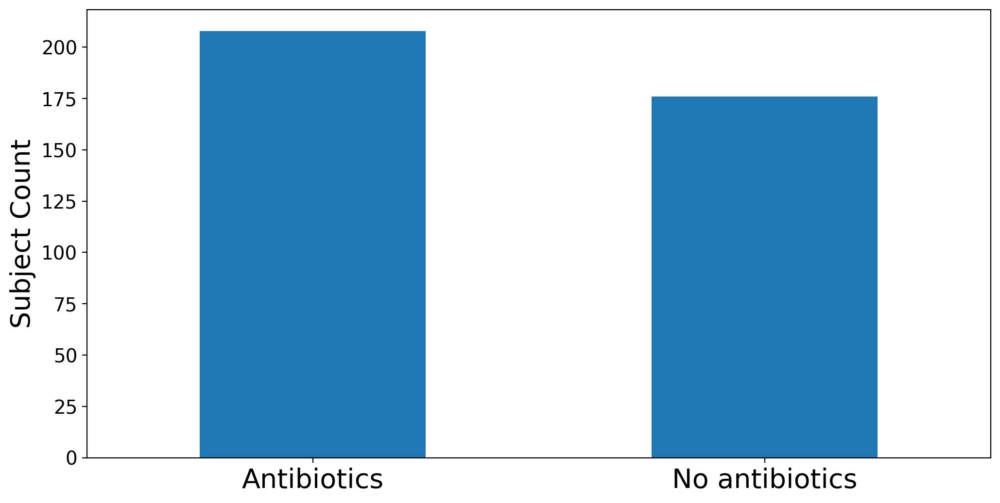

In [71]:
plt.figure(figsize=(12, 6), dpi=200)
abx_counts = metadata.drop_duplicates("Patient_No")["abx"].value_counts()
print(abx_counts)
abx_counts.plot.bar()
plt.ylabel("Subject Count", fontsize=20)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20, rotation=0)
ax.tick_params(axis='y', which='major', labelsize=14)

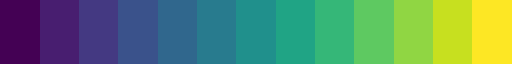

In [72]:
from matplotlib import cm
viridis = cm.get_cmap('viridis', 13)
viridis

In [17]:
plot_index("Shannon Diversity")

NameError: name 'plot_index' is not defined

Antibiotics
28.654545454545456
33.51470588235294
34.333333333333336
35.55555555555556
40.29220779220779
48.5234375
55.607142857142854
56.7
57.17391304347826
56.638888888888886
53.30555555555556
54.22222222222222
54.559633027522935


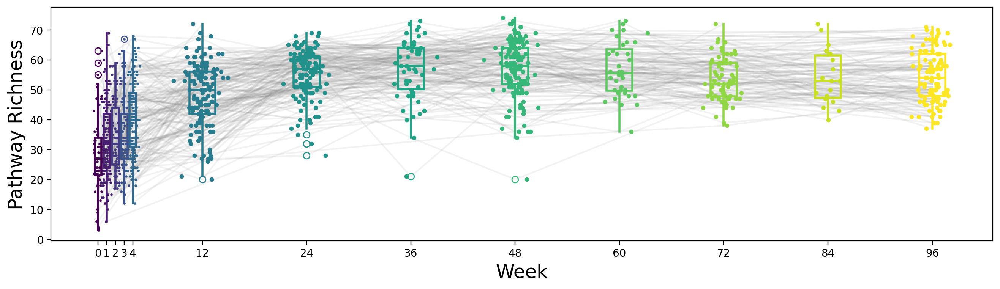

No antibiotics
30.153846153846153
39.850746268656714
40.77333333333333
41.266666666666666
41.86440677966102
49.05042016806723
54.2442748091603
53.54237288135593
54.74603174603175
56.82857142857143
54.666666666666664
54.285714285714285
53.62385321100918


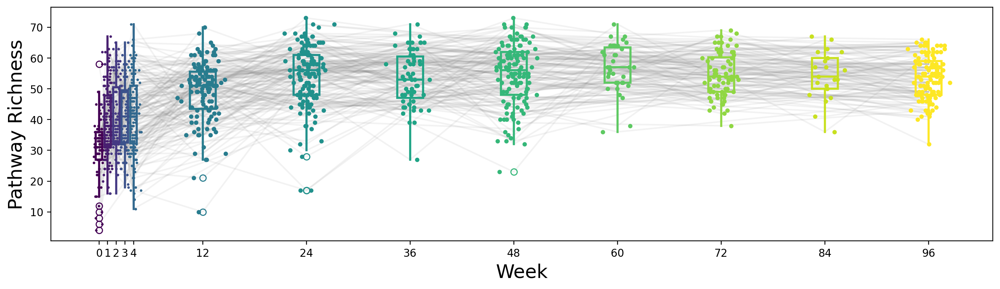

In [34]:
plot_index("Pathway Richness")

In [38]:
from scipy.stats import ranksums

antibiotics = metadata[metadata["abx"] == "Antibiotics"]
no_antibiotics = metadata[metadata["abx"] == "No antibiotics"]

for i, time in enumerate(timepoints_sorted):
    print("Week", time)
    abx = antibiotics[antibiotics["Timeline_Weeks"] == time]["Gene Richness"]
    no_abx = no_antibiotics[no_antibiotics["Timeline_Weeks"] == time]["Gene Richness"]
    print(ranksums(abx, no_abx))

Week 0
RanksumsResult(statistic=-4.898395265378294, pvalue=9.662251757820004e-07)
Week 1
RanksumsResult(statistic=-5.774816174059273, pvalue=7.703714350868033e-09)
Week 2
RanksumsResult(statistic=-3.744331246586422, pvalue=0.00018087489696274494)
Week 3
RanksumsResult(statistic=-2.1961913726553726, pvalue=0.02807824862668563)
Week 4
RanksumsResult(statistic=-1.034373141165695, pvalue=0.300961755731736)
Week 12
RanksumsResult(statistic=-0.4410569691094337, pvalue=0.6591717546790892)
Week 24
RanksumsResult(statistic=0.5953429939665822, pvalue=0.5516142223980782)
Week 36
RanksumsResult(statistic=1.3266634976647378, pvalue=0.18462002087418927)
Week 48
RanksumsResult(statistic=0.7310750560507155, pvalue=0.4647333093241045)
Week 60
RanksumsResult(statistic=-0.5290502621624716, pvalue=0.596770583350869)
Week 72
RanksumsResult(statistic=-1.626179697537928, pvalue=0.10391143380480694)
Week 84
RanksumsResult(statistic=0.3152441624956403, pvalue=0.752576276853584)
Week 96
RanksumsResult(statistic

In [89]:
def plot_index(index):
    fig = plt.figure(figsize=(16, 4), dpi=200)
    ax = plt.gca()
    for j, abx in enumerate(reversed(abxs)):

        plotted_longitudinal = []

        subjects = np.unique(metadata.index)
        for subject in subjects:
            df = metadata.loc[[subject]].copy()
            df = df[df["abx"] == abx]
            df = df.sort_values("timepoint_plot")
            df = df.drop_duplicates("Timeline_Weeks")
            plotted_longitudinal.append(df)
#             ax.plot(df["timepoint_plot"], df[index], c="gray", zorder=0, alpha=0.1)
        ax.set_xticks([int(t) for t in timepoints_sorted])
        ax.set_xticklabels(timepoints_sorted)
        ax.set_ylabel(index, fontsize=18)
        ax.set_xlabel("Week", fontsize=18)

        plotted_df = pd.concat(plotted_longitudinal)

        for i, time in enumerate(timepoints_sorted):
            data = plotted_df[plotted_df["timepoint"] == time][index]
            x_pos = np.ones(data.shape[0]) * int(time)
            scale = 1 if i > 4 else 0.3
            x_pos = 2 * x_pos + np.random.normal(scale=scale, size=x_pos.shape) + j
            sc = ax.scatter(x_pos, data, s=2 if i < 5 else 10, color=viridis(i))
            c = sc.get_facecolors()[0].tolist()
            width = 2.0 if i < 5 else 2
            widths = 0.75 if i < 5 else 3
            bp = ax.boxplot(data, positions=[2 * int(time) + j], patch_artist=True, widths=[widths],
                boxprops=dict(facecolor=[0, 0, 0, 0], color=c, linewidth=width),
                capprops=dict(color=c, linewidth=0),
                whiskerprops=dict(color=c, linewidth=width),
                flierprops=dict(color=c, markeredgecolor=c, linewidth=width),
                medianprops=dict(color=c, linewidth=width))
#         plt.savefig(f"../output/figures/{index}_{abx}.svg", format="svg", bbox_inches='tight')

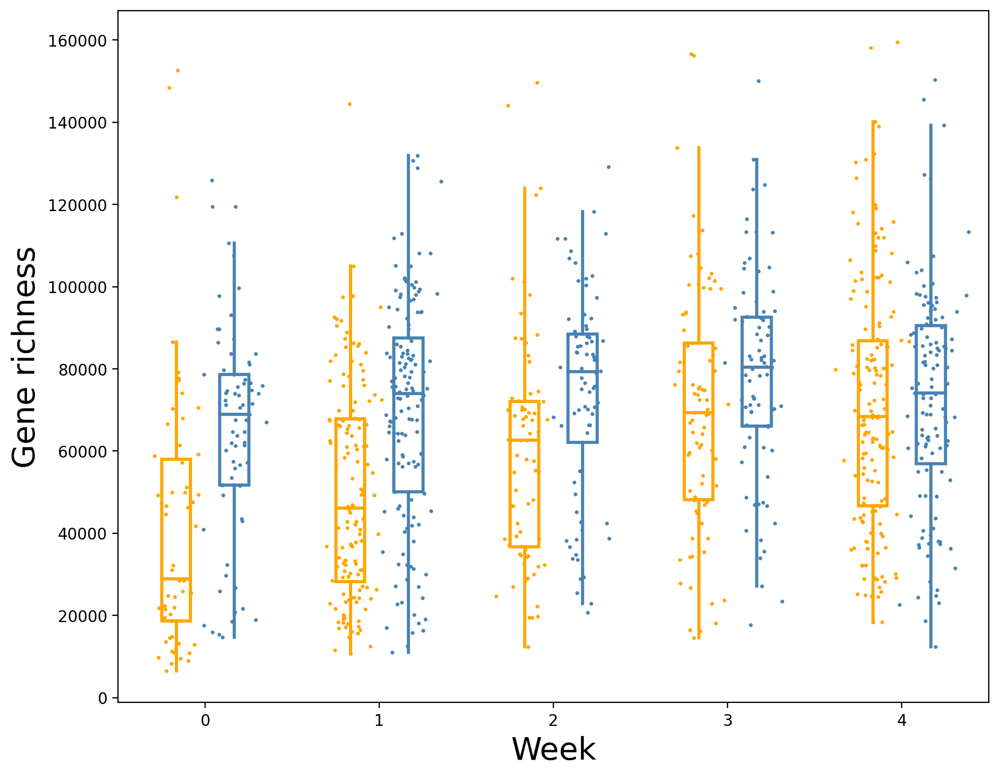

In [122]:
fig = plt.figure(figsize=(10, 8), dpi=200)
ax = plt.gca()

for week in range(5):
    for j, abx in enumerate(reversed(abxs)):
        spacing = 1.5
        data = metadata[(metadata["Timeline_Weeks"] == str(week)) & (metadata["abx"] == abx)]["Gene Richness"]
        x_pos = np.ones(data.shape[0]) * int(week) * spacing
        scale = 0.1
        x_pos = x_pos + np.random.normal(scale=scale, size=x_pos.shape) + j / 2
        sc = ax.scatter(x_pos, data, s=2, color="steelblue" if abx == "No antibiotics" else "orange")
        
        c = sc.get_facecolors()[0].tolist()
        width = 2
        widths = 0.25
        bp = ax.boxplot(data, positions=[spacing * int(week) + j / 2], patch_artist=True, widths=[widths], showfliers=False,
            boxprops=dict(facecolor=[0, 0, 0, 0], color=c, linewidth=width),
            capprops=dict(color=c, linewidth=0),
            whiskerprops=dict(color=c, linewidth=width),
            flierprops=dict(color=c, markeredgecolor=c, linewidth=width),
            medianprops=dict(color=c, linewidth=width))
        
        
plt.xticks(ticks=[i * spacing + 0.25 for i in range(5)], labels=range(5))
plt.xlabel("Week", fontsize=20)
plt.ylabel("Gene richness", fontsize=20)

plt.ylabel("Gene richness", fontsize=20)
        
plt.savefig("../output/figures/gene_richness_early.svg")
        

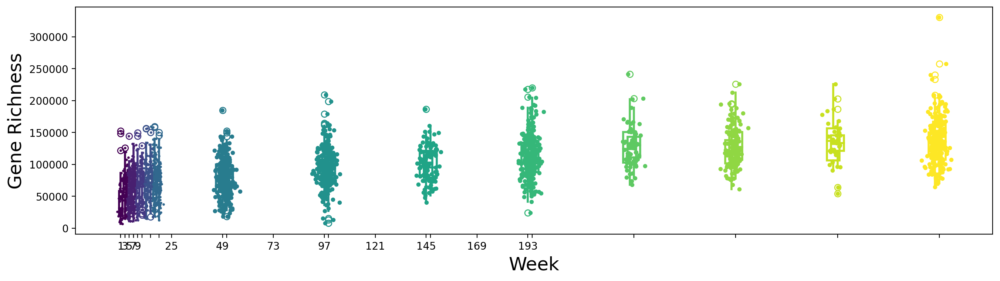

In [90]:
plot_index("Gene Richness")

Antibiotics
42603.472727272725
50177.32352941176
60270.125
69683.37037037036
70968.02597402598
79245.859375
97266.03571428571
104170.04
114477.36231884058
126962.30555555556
121497.875
137501.5
134732.75229357797


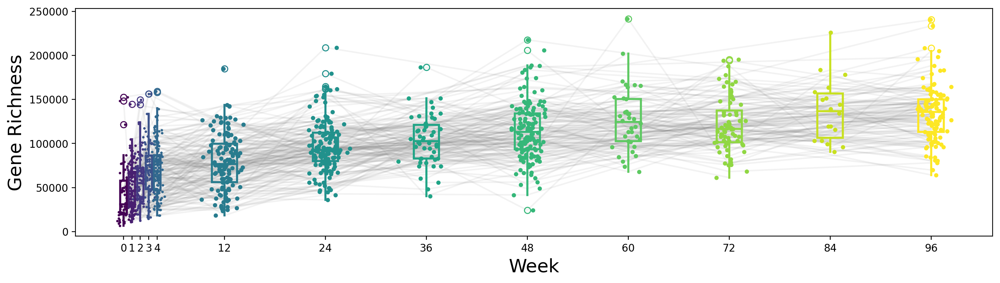

No antibiotics
64383.16923076923
69717.61940298507
74780.74666666667
78241.29333333333
72636.69491525424
80530.3193277311
93661.26717557252
97261.77966101695
112264.16666666667
128916.68571428572
130317.69444444444
131532.66666666666
139074.09174311926


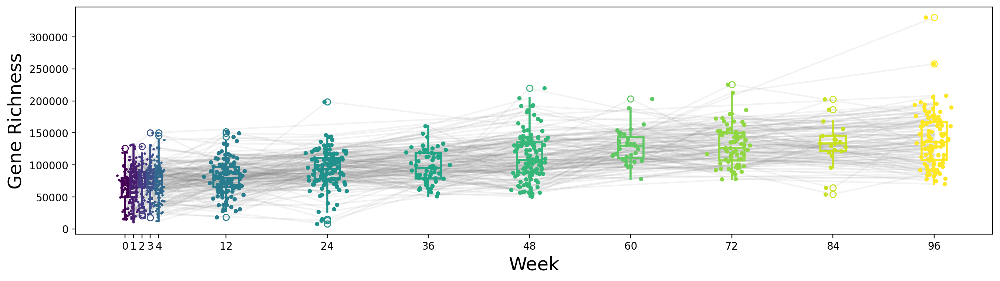

In [39]:
plot_index("Gene Richness")

In [30]:
from scipy.stats import wilcoxon

for i in range(5):
    for j in range(5):
        if i <= j: continue
        before = metadata[(metadata["Timeline_Weeks"] == str(i))]
        after = metadata[(metadata["Timeline_Weeks"] == str(j))]


        in_both = set(before.index) & set(after.index)
        before = before.loc[in_both]
        after = after.loc[in_both]

        before = before[~before.index.duplicated(keep='first')]
        after = after[~after.index.duplicated(keep='first')]

        print(i, j)
        res = wilcoxon(before["Pathway Richness"], after["Pathway Richness"])
        print(res)

1 0
WilcoxonResult(statistic=596.5, pvalue=9.326926329896746e-05)
2 0
WilcoxonResult(statistic=967.0, pvalue=0.001089480907410757)
2 1
WilcoxonResult(statistic=2679.5, pvalue=0.09067709165003571)
3 0
WilcoxonResult(statistic=861.5, pvalue=0.00010256281929088894)
3 1
WilcoxonResult(statistic=2808.5, pvalue=0.01591224463728019)
3 2
WilcoxonResult(statistic=2584.0, pvalue=0.3426603041675452)
4 0
WilcoxonResult(statistic=575.5, pvalue=3.227869576769652e-07)
4 1
WilcoxonResult(statistic=5452.5, pvalue=1.2625046552063081e-07)
4 2
WilcoxonResult(statistic=2109.0, pvalue=0.06109091697819359)
4 3
WilcoxonResult(statistic=1890.5, pvalue=0.013927242531994575)


/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/1523428254.py:11: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  before = before.loc[in_both]
/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/1523428254.py:12: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  after = after.loc[in_both]
/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/1523428254.py:11: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  before = before.loc[in_both]
/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/1523428254.py:12: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  after = after.loc[in_both]
/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/1523428254.py:11: FutureWarning: Pas

In [33]:
metadata["abx"]

Patient_No
105    No antibiotics
105    No antibiotics
101    No antibiotics
105    No antibiotics
106    No antibiotics
            ...      
588    No antibiotics
595    No antibiotics
585       Antibiotics
573       Antibiotics
603    No antibiotics
Name: abx, Length: 2357, dtype: object

In [135]:
metadata.columns

Index(['Patient_No', 'Hospital', 'Date_Collected', 'Time_Collected',
       'Timeline_Weeks', 'Abx_regular', 'Abx_anomoly',
       'Abx_timeline.prior..during..after.', 'abx_day', 'Consistency', 'Color',
       'Amount', 'dob', 'babysex', 'gestational_age_wk',
       'gestational_age_days', 'weight1', 'sizeforgestationalage', 'icn',
       'icnabx', 'mat_ageatadm', 'gravidity_n', 'parity_n', 'laboronset_type',
       'rom_hr', 'deliverymethod', 'sepsisrisk', 'multip_yn',
       'weight_prepregnancy_2', 'maternalheight', 'gbs_result', 'motherrace',
       'motherethnicity', 'expo_cat1', 'expo_cat2', 'calc_age_mo',
       'currentfeed_bf', 'currentfeed_f', 'currentfeed_o',
       'Sequencing_Project', 'Filename', 'Extraction', 'depth',
       'Gene Richness', 'CAG Richness', 'Pathway Richness', 'Species Richness',
       'Shannon Diversity', 'abx', 'longum', 'Max PTR', 'timepoint',
       'timepoint_plot', 'Mean PTR'],
      dtype='object')

In [141]:
from scipy.stats import ranksums

antibiotics = metadata[metadata["abx"] == "Antibiotics"]
no_antibiotics = metadata[metadata["abx"] == "No antibiotics"]

for i, time in enumerate(timepoints_sorted):
    print("Week", time)
    abx = antibiotics[antibiotics["Timeline_Weeks"] == time]["Pathway Richness"]
    no_abx = no_antibiotics[no_antibiotics["Timeline_Weeks"] == time]["Pathway Richness"]
    print(ranksums(abx, no_abx))

Week 0
RanksumsResult(statistic=-2.0809411867239533, pvalue=0.03743928965570013)
Week 1
RanksumsResult(statistic=-4.362714835180925, pvalue=1.284583381091702e-05)
Week 2
RanksumsResult(statistic=-3.236007588622589, pvalue=0.001212141616291503)
Week 3
RanksumsResult(statistic=-3.269543644139622, pvalue=0.0010772111807048094)
Week 4
RanksumsResult(statistic=-1.19049042566877, pvalue=0.233853690896076)
Week 12
RanksumsResult(statistic=-0.14790464626762134, pvalue=0.8824180213481414)
Week 24
RanksumsResult(statistic=1.002723315868973, pvalue=0.31599437699649313)
Week 36
RanksumsResult(statistic=1.926963722852402, pvalue=0.053984151088635295)
Week 48
RanksumsResult(statistic=1.8754007370966574, pvalue=0.06073761381388758)
Week 60
RanksumsResult(statistic=-0.40828878927755957, pvalue=0.6830616688122733)
Week 72
RanksumsResult(statistic=-1.2426090563496206, pvalue=0.21401193102148075)
Week 84
RanksumsResult(statistic=0.013135173437318345, pvalue=0.9895199492704789)
Week 96
RanksumsResult(stat

No antibiotics
Antibiotics


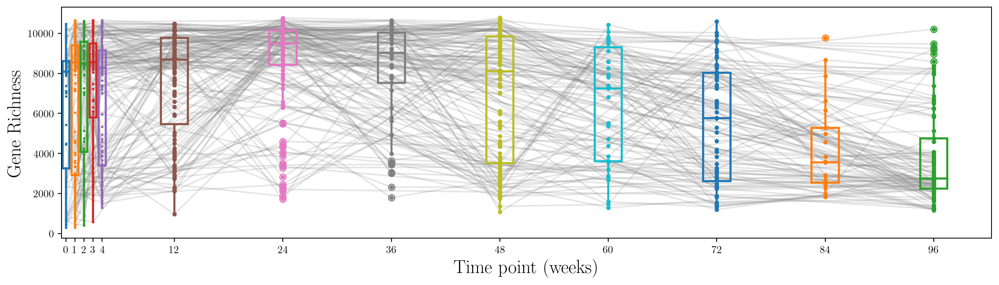

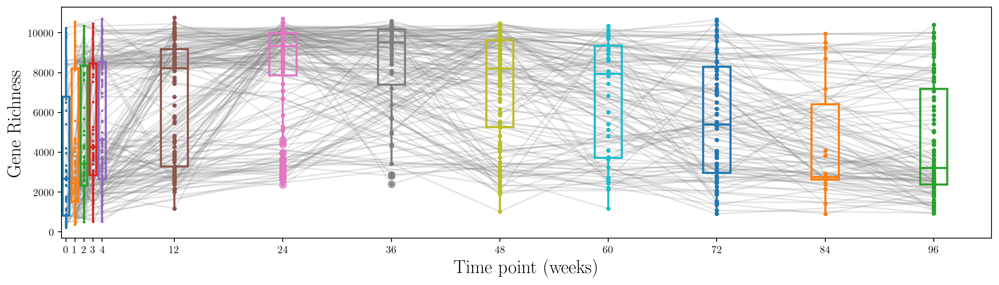

In [19]:
plot_index("Gene Richness")

In [20]:
metadata.columns

Index(['Patient_No', 'Hospital', 'Date_Collected', 'Time_Collected',
       'Timeline_Weeks', 'Abx_regular', 'Abx_anomoly',
       'Abx_timeline.prior..during..after.', 'abx_day', 'Consistency', 'Color',
       'Amount', 'dob', 'babysex', 'gestational_age_wk',
       'gestational_age_days', 'weight1', 'sizeforgestationalage', 'icn',
       'icnabx', 'mat_ageatadm', 'gravidity_n', 'parity_n', 'laboronset_type',
       'rom_hr', 'deliverymethod', 'sepsisrisk', 'multip_yn',
       'weight_prepregnancy_2', 'maternalheight', 'gbs_result', 'motherrace',
       'motherethnicity', 'expo_cat1', 'expo_cat2', 'calc_age_mo',
       'currentfeed_bf', 'currentfeed_f', 'currentfeed_o',
       'Sequencing_Project', 'Filename', 'Extraction', 'depth',
       'Gene Richness', 'CAG Richness', 'Pathway Richness', 'Species Richness',
       'Shannon Diversity', 'abx', 'longum', 'Max PTR', 'timepoint',
       'timepoint_plot'],
      dtype='object')

/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_84907/2440689067.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["Gene Richness (Full)"] = metadata["Gene Richness"]


No antibiotics
Antibiotics


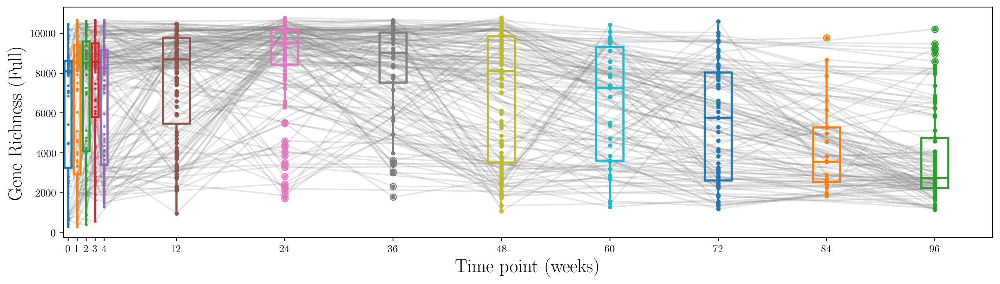

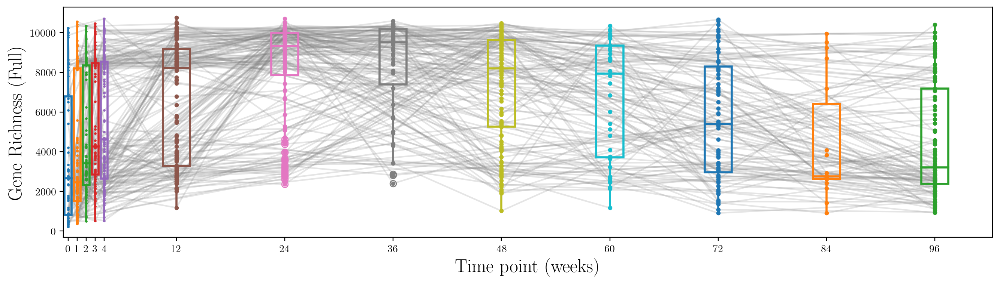

In [21]:
metadata["Gene Richness (Full)"] = metadata["Gene Richness"]

plot_index("Gene Richness (Full)")

No antibiotics
Antibiotics


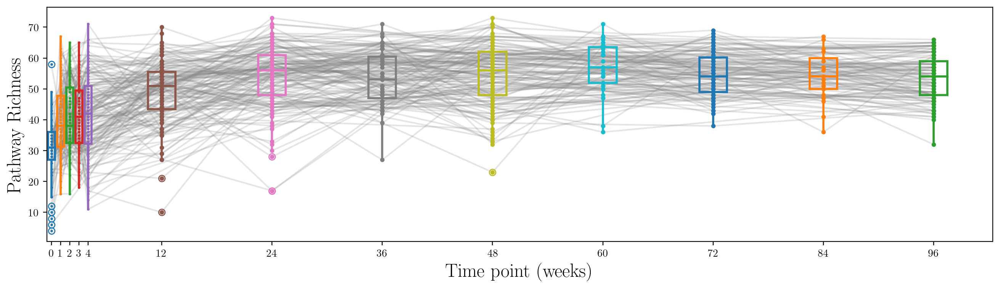

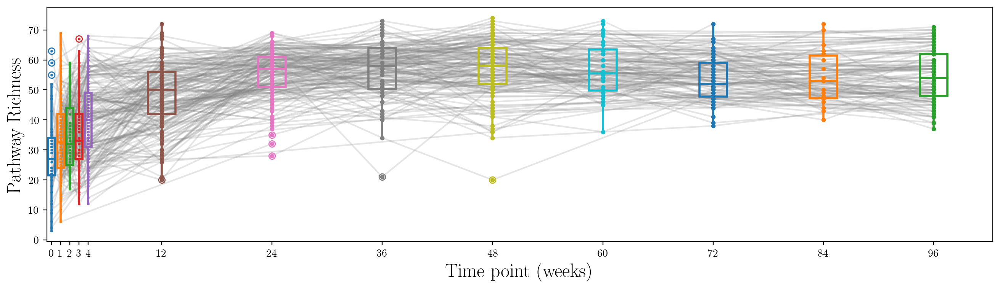

In [22]:
plot_index("Pathway Richness")

No antibiotics
Antibiotics


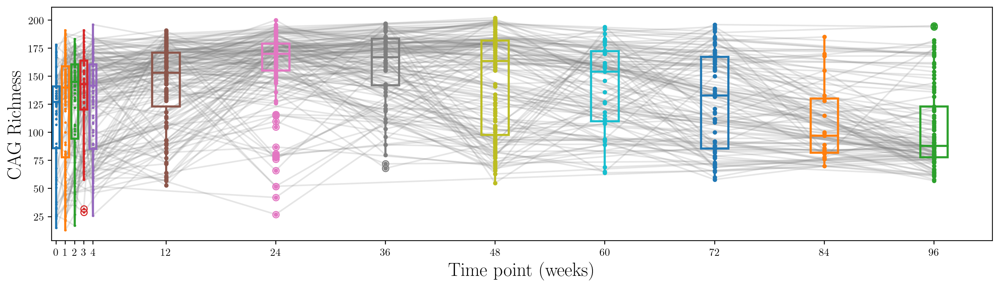

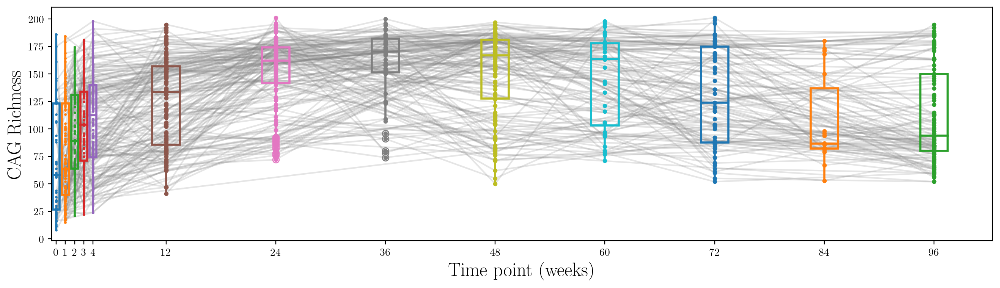

In [23]:
plot_index("CAG Richness")

No antibiotics
Antibiotics


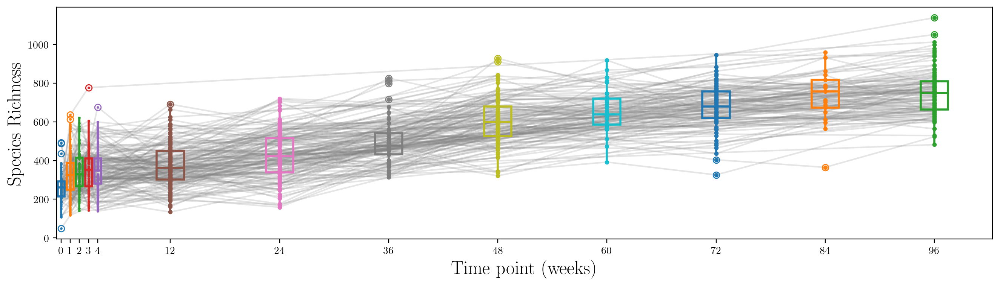

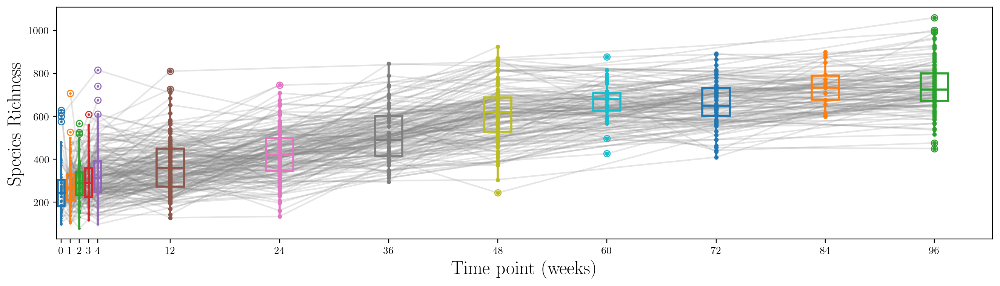

In [24]:
plot_index("Species Richness")

/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_84907/2053227035.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["Bifidobacterium longum PTR"] = metadata["longum"]


No antibiotics
Antibiotics


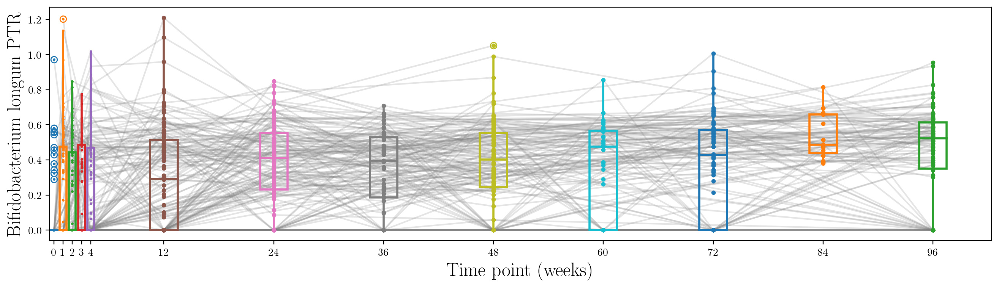

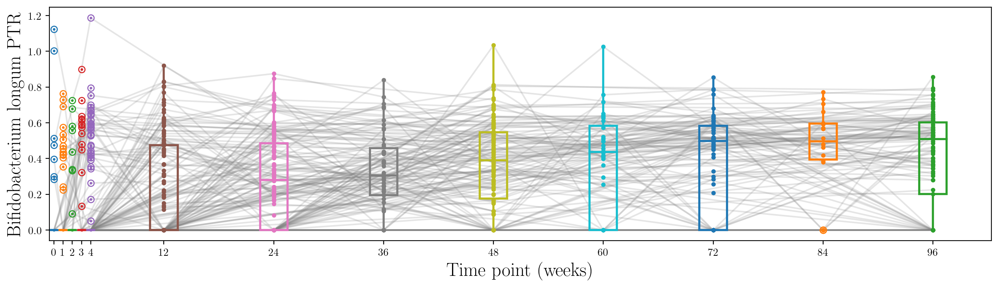

In [25]:

metadata["Bifidobacterium longum PTR"] = metadata["longum"]

plot_index("Bifidobacterium longum PTR")

In [73]:
timepoints_sorted2 = timepoints_sorted[:5]
timepoints_sorted2

['0', '1', '2', '3', '4']

In [74]:
metadata2 = metadata[metadata["Timeline_Weeks"].apply(lambda x : int(x) < 5)]
metadata2

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,CAG Richness,Pathway Richness,Species Richness,Shannon Diversity,abx,longum,Max PTR,Mean PTR,timepoint,timepoint_plot
Patient_No,,,,,,,,,,,,,,,,,,,,,
105,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,146,36,243,2.248965,No antibiotics,0.000000,0.902548,0.556957,0,0
105,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,129,39,160,1.548390,No antibiotics,0.000000,0.000000,NaN,0,0
101,101,no,12/10/16,2230,0,regular,NaN,NaN,NaN,NaN,...,126,40,150,0.932723,No antibiotics,0.000000,0.491696,0.491696,0,0
105,105,no,12/22/16,950,1,regular,NaN,NaN,NaN,soft,...,152,40,304,1.928827,No antibiotics,0.000000,0.467869,0.305831,1,1
106,106,no,12/22/16,250,1,regular,NaN,NaN,NaN,watery,...,150,31,209,1.177484,No antibiotics,0.000000,0.600675,0.382310,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604,604,NaN,11/5/19,1100,4,regular,NaN,NaN,NaN,watery,...,119,47,448,2.517823,Antibiotics,0.430196,0.673513,0.532861,4,4
594,594,NaN,NaN,NaN,1,regular,NaN,NaN,NaN,soft,...,73,15,324,2.633181,Antibiotics,0.000000,0.490739,0.490739,1,1
592,592,NaN,9/2/19,602,1,regular,NaN,NaN,NaN,watery,...,140,37,430,2.798011,Antibiotics,0.000000,0.591093,0.500459,1,1


In [80]:
from scipy.stats import wilcoxon

for i in range(5):
    for j in range(5):
        if i <= j: continue
        before = metadata2[(metadata2["Timeline_Weeks"] == str(i)) & (metadata2["Mean PTR"] != 0)]
        before = before[~before["Mean PTR"].isna()]
        after = metadata2[(metadata2["Timeline_Weeks"] == str(j)) & (metadata2["Mean PTR"] != 0)]
        after = after[~after["Mean PTR"].isna()]

        in_both = set(before.index) & set(after.index)
        before = before.loc[in_both]
        after = after.loc[in_both]

        before = before[~before.index.duplicated(keep='first')]
        after = after[~after.index.duplicated(keep='first')]

        print(i, j)
        res = wilcoxon(before["Mean PTR"], after["Mean PTR"])
        print(res)

1 0
WilcoxonResult(statistic=227.0, pvalue=0.0007512009903507533)
2 0
WilcoxonResult(statistic=337.0, pvalue=0.06569591060303992)
2 1
WilcoxonResult(statistic=1505.0, pvalue=0.11552400845964117)
3 0
WilcoxonResult(statistic=440.0, pvalue=0.19311290328303699)
3 1
WilcoxonResult(statistic=1572.0, pvalue=0.027255488764526)
3 2
WilcoxonResult(statistic=853.0, pvalue=0.003983345918703417)
4 0
WilcoxonResult(statistic=504.0, pvalue=0.5323554288720374)
4 1
WilcoxonResult(statistic=3185.0, pvalue=8.304091184392571e-07)
4 2
WilcoxonResult(statistic=990.0, pvalue=0.06903529820824078)
4 3
WilcoxonResult(statistic=1243.0, pvalue=0.8410549509111008)


/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/4218609089.py:12: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  before = before.loc[in_both]
/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/4218609089.py:13: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  after = after.loc[in_both]
/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/4218609089.py:12: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  before = before.loc[in_both]
/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/4218609089.py:13: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  after = after.loc[in_both]
/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_9742/4218609089.py:12: FutureWarning: Pas

In [78]:
def plot_index(index):
    fig = plt.figure(figsize=(10, 5), dpi=200)
    ax = plt.gca()

    plotted_longitudinal = []

    subjects = np.unique(metadata2.index)
    for subject in subjects:
        df = metadata2.loc[[subject]].copy()
#         df = df[df["abx"] == abx]
        df = df.sort_values("timepoint_plot")
        df = df.drop_duplicates("Timeline_Weeks")
        df = df[(df["Mean PTR"] != 0) & (~df["Mean PTR"].isna())]
        plotted_longitudinal.append(df)
        ax.plot(df["timepoint_plot"], df[index], c="gray", zorder=0, alpha=0.1)
    ax.set_xticks([int(t) for t in timepoints_sorted2])
    ax.set_xticklabels(timepoints_sorted2)
    ax.set_ylabel(index, fontsize=18)
    ax.set_xlabel("Week", fontsize=18)

    plotted_df = pd.concat(plotted_longitudinal)

    for i, time in enumerate(timepoints_sorted2):
        data = plotted_df[plotted_df["timepoint"] == time][index]
        x_pos = np.ones(data.shape[0]) * int(time)
        scale = 1 if i > 4 else 0.3
        x_pos = x_pos + np.random.normal(scale=scale, size=x_pos.shape)
        sc = ax.scatter(x_pos, data, s=2 if i < 5 else 10)
        c = sc.get_facecolors()[0].tolist()
        width = 2.0 if i < 5 else 2
        widths = 0.75 if i < 5 else 3
        bp = ax.boxplot(data, positions=[int(time)], patch_artist=True, widths=[widths], showfliers=False,
            boxprops=dict(facecolor=[0, 0, 0, 0], color=c, linewidth=width),
            capprops=dict(color=c, linewidth=0),
            whiskerprops=dict(color=c, linewidth=width),
            flierprops=dict(color=c, markeredgecolor=c, linewidth=width),
            medianprops=dict(color=c, linewidth=width))
    plt.ylim(0, 1.8)
    plt.savefig(f"../output/figures/{index}_.svg", format="svg", bbox_inches='tight')
    plt.show()

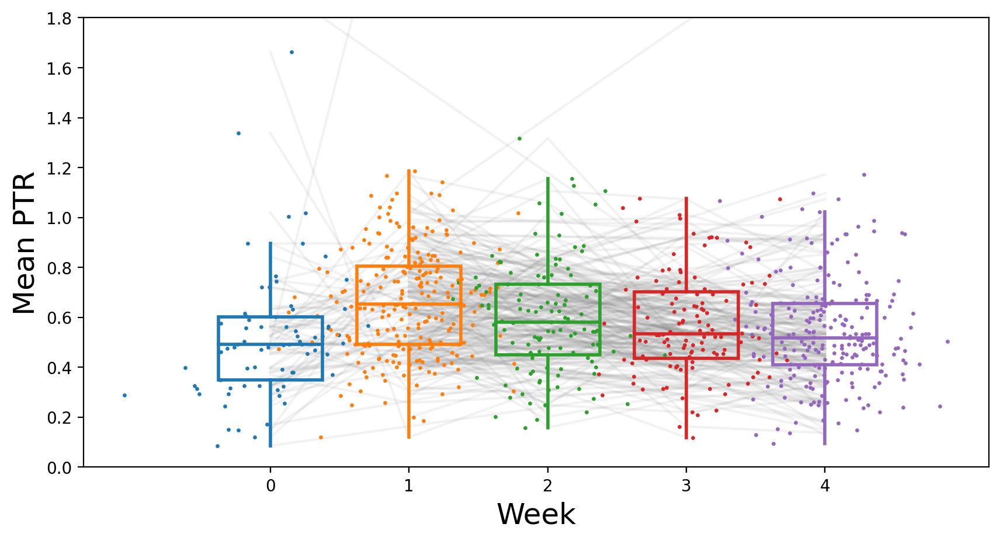

In [79]:
plot_index("Mean PTR")

In [99]:
metadata.columns

Index(['Patient_No', 'Hospital', 'Date_Collected', 'Time_Collected',
       'Timeline_Weeks', 'Abx_regular', 'Abx_anomoly',
       'Abx_timeline.prior..during..after.', 'abx_day', 'Consistency', 'Color',
       'Amount', 'dob', 'babysex', 'gestational_age_wk',
       'gestational_age_days', 'weight1', 'sizeforgestationalage', 'icn',
       'icnabx', 'mat_ageatadm', 'gravidity_n', 'parity_n', 'laboronset_type',
       'rom_hr', 'deliverymethod', 'sepsisrisk', 'multip_yn',
       'weight_prepregnancy_2', 'maternalheight', 'gbs_result', 'motherrace',
       'motherethnicity', 'expo_cat1', 'expo_cat2', 'calc_age_mo',
       'currentfeed_bf', 'currentfeed_f', 'currentfeed_o',
       'Sequencing_Project', 'Filename', 'Extraction', 'depth',
       'Gene Richness', 'CAG Richness', 'Pathway Richness', 'Species Richness',
       'Shannon Diversity', 'abx', 'longum', 'Max PTR', 'timepoint',
       'timepoint_plot', 'Mean PTR'],
      dtype='object')

(array(['0', '1', '10', '2', '30', '31', '32', '5', '7', 'Na', 'na', 'nan'],
       dtype='<U3'),
 array([  12,    3,   10,    1,    6,    1,    1,    2,    1,    1,   26,
        2293]))

In [23]:
ptr

,magic.0001,magic.0004,magic.0006,magic.0007,magic.0008,magic.0010,magic.0011,magic.0012,magic.0013,magic.0014,...,magic.6590,magic.6591,magic.6592,magic.6593,magic.6594,magic.6595,magic.6597,magic.6598,magic.6599,magic.6600
gtdb_taxonomy,,,,,,,,,,,,,,,,,,,,,
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Streptococcaceae;g__Streptococcus;s__Streptococcus thermophilus,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.890374,0.000000,0.000000,0.000000,0.000000,0.000000,0.398078,0.000000,0.443034
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__Oscillospiraceae;g__Intestinimonas;s__Intestinimonas butyriciproducens,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.181598,0.000000,0.000000,0.000000,0.153008,0.164560,0.000000,0.181179,0.000000,0.364100
d__Bacteria;p__Verrucomicrobia;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia;s__Akkermansia muciniphila,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.531152,0.000000,0.000000,0.000000,0.000000,0.385291,0.339425
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__Ruminococcaceae;g__Ruminiclostridium_E;s__Ruminiclostridium_E siraeum,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.366896,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Bifidobacteriaceae;g__Bifidobacterium;s__Bifidobacterium longum,0.0,0.0,0.0,0.0,0,0.0,0.439616,0.0,0.0,0.0,...,0.000000,0.648231,0.639207,0.000000,0.279416,0.547436,0.706284,0.624992,0.793504,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d__Bacteria;p__Firmicutes;c__Clostridia;o__Lachnospirales;f__Lachnospiraceae;g__Blautia;s__,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces_B;s__,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Betaproteobacteriales;f__Burkholderiaceae;g__Diaphorobacter;s__Diaphorobacter ebreus,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
test = metadata.drop_duplicates("Patient_No")
plt.figure(figsize=(8, 6), dpi=200)
abx_counts = test[test["abx"] == "No antibiotics"]["expo_cat2"].value_counts()
print(abx_counts)
abx_counts.plot.bar()
plt.ylabel("Subject Count", fontsize=20)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20, rotation=0)
ax.tick_params(axis='y', which='major', labelsize=14)

In [ ]:
plt.figure(figsize=(12, 6), dpi=200)
abx_counts = test[test["abx"] == "Other antibiotics"]["expo_cat2"].value_counts()
print(abx_counts)
abx_counts.plot.bar()
plt.ylabel("Subject Count", fontsize=20)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20, rotation=0)
ax.tick_params(axis='y', which='major', labelsize=14)

In [ ]:
plt.figure(figsize=(8, 6), dpi=200)
abx_counts = test[test["abx"] == "GBS antibiotics"]["expo_cat2"].value_counts()
print(abx_counts)
abx_counts.plot.bar()
plt.ylabel("Subject Count", fontsize=20)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20, rotation=0)
ax.tick_params(axis='y', which='major', labelsize=14)

In [24]:
metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,CAG Richness,Pathway Richness,Species Richness,abx,longum,Max PTR,timepoint,timepoint_plot,Gene Richness (Full),Bifidobacterium longum log2(PTR)
Patient_No,,,,,,,,,,,,,,,,,,,,,
101,101,no,12/10/16,1430,0,regular,NaN,NaN,NaN,NaN,...,119,37,451,No antibiotics,0.000000,0.383492,0,0,7764,0.000000
101,101,no,12/15/16,NaN,1,regular,NaN,NaN,NaN,NaN,...,119,28,550,No antibiotics,0.000000,0.392621,1,1,7753,0.000000
104,104,yes,12/15/16,2335,0,regular,NaN,NaN,NaN,NaN,...,52,19,695,No antibiotics,0.000000,0.904895,0,0,2888,0.000000
105,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,146,36,707,No antibiotics,0.000000,0.902548,0,0,8650,0.000000
105,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,129,39,391,No antibiotics,0.000000,0.000000,0,0,7908,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
588,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,119,64,1999,No antibiotics,0.547436,0.953729,96,96,3745,0.547436
595,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,73,52,1775,No antibiotics,0.706284,0.706284,96,96,1928,0.706284
585,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,112,67,1594,GBS antibiotics,0.624992,0.624992,96,96,4586,0.624992
